# Implementation of GAN with R1 Regularizer
Reference: https://arxiv.org/pdf/1801.04406

In [1]:
# Run the comment below only when using Google Colab
# !pip install torch torchvision

In [2]:
#!g1.1
import torch
import torchvision
import torch.nn as nn
import torch.nn.functional as F
from torch.autograd import grad

In [3]:
#!g1.1
from torch.utils.data import DataLoader
from torch.utils.data.dataset import Dataset
from torchvision import datasets
from torchvision import transforms
from torchvision.utils import save_image

In [4]:
#!g1.1
import numpy as np
import datetime
import os, sys
import glob
from tqdm import tqdm

In [5]:
#!g1.1
from PIL import Image

In [6]:
#!g1.1
import matplotlib.pyplot as plt
from matplotlib.pyplot import imshow, imsave
%matplotlib inline

In [7]:
#!g1.1
MODEL_NAME = 'R1'
DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")

In [8]:
#!g1.1
IMAGE_DIM = (64, 64, 3)

In [9]:
#!g1.1
def tensor2img(tensor):
    img = (np.transpose(tensor.detach().cpu().numpy(), [1,2,0])+1)/2.
    return img

In [10]:
#!g1.1
def get_sample_image(G, n_noise=100, n_samples=64):
    """
        save sample 100 images
    """
    n_rows = int(np.sqrt(n_samples))
    z = (torch.rand(size=[n_samples, n_noise])*2-1).to(DEVICE) # U[-1, 1]
    x_fake = G(z)
    x_fake = torch.cat([torch.cat([x_fake[n_rows*j+i] for i in range(n_rows)], dim=1) for j in range(n_rows)], dim=2)
    result = tensor2img(x_fake)
    return result

In [11]:
#!g1.1
class ResidualBlock(nn.Module):
    def __init__(self, inplanes, planes, kernel_size=3, stride=1, downsample=None, groups=1):
        super(ResidualBlock, self).__init__()
        p = kernel_size//2
        self.conv1 = nn.Sequential(
            nn.Conv2d(inplanes, planes, kernel_size, stride=stride, padding=p),
            nn.LeakyReLU(0.2)
        )
        self.conv2 = nn.Sequential(
            nn.Conv2d(planes, planes, kernel_size, padding=p),
            nn.LeakyReLU(0.2)
        )
        self.proj = nn.Conv2d(inplanes, planes, 1) if inplanes != planes else None
    
    def forward(self, x):
        identity = x
        
        y = self.conv1(x)
        y = self.conv2(y)
        
        identity = identity if self.proj is None else self.proj(identity)
        y = y + identity
        return y

In [12]:
#!g1.1
class Discriminator(nn.Module):
    """
        Convolutional Discriminator
    """
    def __init__(self, in_channel=1):
        super(Discriminator, self).__init__()
        self.D = nn.Sequential(
            nn.Conv2d(in_channel, 64, 3, padding=1), # (N, 64, 64, 64)
            ResidualBlock(64, 128),
            nn.AvgPool2d(3, 2, padding=1), # (N, 128, 32, 32)
            ResidualBlock(128, 256),
            nn.AvgPool2d(3, 2, padding=1), # (N, 256, 16, 16)
            ResidualBlock(256, 512),
            nn.AvgPool2d(3, 2, padding=1), # (N, 512, 8, 8)
            ResidualBlock(512, 1024),
            nn.AvgPool2d(3, 2, padding=1) # (N, 1024, 4, 4)
        )
        self.fc = nn.Linear(1024*4*4, 1) # (N, 1)
        
    def forward(self, x):
        B = x.size(0)
        h = self.D(x)
        h = h.view(B, -1)
        y = self.fc(h)
        return y

In [13]:
#!g1.1
class Generator(nn.Module):
    """
        Convolutional Generator
    """
    def __init__(self, out_channel=1, n_filters=128, n_noise=512):
        super(Generator, self).__init__()
        self.fc = nn.Linear(n_noise, 1024*4*4)
        self.G = nn.Sequential(
            ResidualBlock(1024, 512),
            nn.Upsample(scale_factor=2, mode='bilinear'), # (N, 512, 8, 8)
            ResidualBlock(512, 256),
            nn.Upsample(scale_factor=2, mode='bilinear'), # (N, 256, 16, 16)
            ResidualBlock(256, 128),
            nn.Upsample(scale_factor=2, mode='bilinear'), # (N, 128, 32, 32)
            ResidualBlock(128, 64),
            nn.Upsample(scale_factor=2, mode='bilinear'), # (N, 64, 64, 64)
            ResidualBlock(64, 64),
            nn.Conv2d(64, out_channel, 3, padding=1) # (N, 3, 64, 64)
        )
        
    def forward(self, z):
        B = z.size(0)
        h = self.fc(z)
        h = h.view(B, 1024, 4, 4)
        x = self.G(h)
        return x

In [14]:
#!g1.1
from torch.utils.data import Dataset, DataLoader
from tqdm import tqdm
from PIL import Image
class ImageDataset(Dataset):
    def __init__(self, data_root, transform):
        self.samples = []
        self.transform = transform

        for class_dir in os.listdir(data_root):
            data_folder = os.path.join(data_root, class_dir)

            for image_dir in tqdm(os.listdir(data_folder)):
                img = Image.open(f'{data_folder}/{image_dir}')
                img = img.convert("RGB")
                self.samples.append(self.transform(img))


    def __len__(self):
        return len(self.samples)

    def __getitem__(self, idx):
        return self.samples[idx]

In [15]:
#!g1.1
from torch.utils.data import Dataset, DataLoader
from tqdm import tqdm
from PIL import Image
class ImageDataset(Dataset):
    def __init__(self, data_root, transform):
        self.samples = []
        self.transform = transform

        for class_dir in os.listdir(data_root):
            data_folder = os.path.join(data_root, class_dir)

            for image_dir in tqdm(os.listdir(data_folder)):
                img = Image.open(f'{data_folder}/{image_dir}')
                img = img.convert("RGB")
                self.samples.append(self.transform(img))


    def __len__(self):
        return len(self.samples)

    def __getitem__(self, idx):
        return self.samples[idx]

In [16]:
#!g1.1
transform = transforms.Compose([transforms.Resize((IMAGE_DIM[0],IMAGE_DIM[1])),
                                transforms.ToTensor(),
                                transforms.Normalize(mean=(0.5, 0.5, 0.5),
                                std=(0.5, 0.5, 0.5))
                               ]
)

CelebA-aligned download: [link](http://mmlab.ie.cuhk.edu.hk/projects/CelebA.html)

In [17]:
#!g1.1
dataset = ImageDataset('/home/jupyter/work/resources/DataGAN', transform=transform)

100%|██████████| 21551/21551 [00:51<00:00, 415.91it/s]


In [34]:
#!g1.1
batch_size = 128
n_noise = 256

In [35]:
#!g1.1
data_loader = DataLoader(dataset, batch_size=batch_size, shuffle=True, drop_last=True, num_workers=4, pin_memory=True)

In [20]:
#!g1.1
D = Discriminator(in_channel=IMAGE_DIM[-1]).to(DEVICE)
G = Generator(out_channel=IMAGE_DIM[-1], n_noise=n_noise).to(DEVICE)

In [21]:
#!g1.1
D_opt = torch.optim.RMSprop(D.parameters(), lr=1e-4, alpha=0.99)
G_opt = torch.optim.RMSprop(G.parameters(), lr=1e-4, alpha=0.99)

In [22]:
#!g1.1
# D_scheduler = torch.optim.lr_scheduler.MultiStepLR(D_opt, milestones=[3, 10, 17], gamma=0.6)
# G_scheduler = torch.optim.lr_scheduler.MultiStepLR(G_opt, milestones=[3, 10, 17], gamma=0.6)

In [23]:
#!g1.1
# criterion = nn.L1Loss()
def r1loss(inputs, label=None):
    # non-saturating loss with R1 regularization
    l = -1 if label else 1
    return F.softplus(l*inputs).mean()

In [24]:
#!g1.1
max_epoch = 1000
step = 0

In [25]:
#!g1.1
log_term = 1000
save_term = 1000

In [26]:
#!g1.1
r1_gamma = 10

In [27]:
#!g1.1
steps_per_epoch = len(data_loader.dataset) // batch_size
steps_per_epoch

10

In [28]:
#!g1.1
if not os.path.exists('samples'):
    os.makedirs('samples')
    
if not os.path.exists('ckpt'):
    os.makedirs('ckpt')

In [29]:
#!g1.1
def save_checkpoint(state, file_name='checkpoint.pth.tar'):
    torch.save(state, file_name)

In [40]:
#!g1.1
def TensorToImage(img, mean=0.5, std=0.28):
    # Convert a tensor to an image
    img = np.transpose(img.numpy(), (1, 2, 0))
    img = (img*std + mean)*255
    img = img.astype(np.uint8)    
    return img  

In [44]:
#!g1.1
import warnings
warnings.filterwarnings('ignore')
from IPython.display import clear_output, HTML, display
for epoch in range(max_epoch):
    for idx, images in enumerate(tqdm(data_loader, total=len(data_loader))):
        G.zero_grad()
        # Training Discriminator
        x = images.to(DEVICE)
        x.requires_grad = True
        x_outputs = D(x)
        d_real_loss = r1loss(x_outputs, True)
        # Reference >> https://github.com/rosinality/style-based-gan-pytorch/blob/a3d000e707b70d1a5fc277912dc9d7432d6e6069/train.py
        # little different with original DiracGAN
        grad_real = grad(outputs=x_outputs.sum(), inputs=x, create_graph=True)[0]
        grad_penalty = (grad_real.view(grad_real.size(0), -1).norm(2, dim=1) ** 2).mean()
        grad_penalty = 0.5*r1_gamma*grad_penalty
        D_x_loss = d_real_loss + grad_penalty

        z = (torch.rand(size=[batch_size, n_noise])*2-1).to(DEVICE)
        x_fake = G(z)
        z_outputs = D(x_fake.detach())
        D_z_loss = r1loss(z_outputs, False)
        D_loss = D_x_loss + D_z_loss
        
        D.zero_grad()
        D_loss.backward()
        D_opt.step()

        # Training Generator
        z = (torch.rand(size=[batch_size, n_noise])*2-1).to(DEVICE)
        x_fake = G(z)
        z_outputs = D(x_fake)
        G_loss = r1loss(z_outputs, True)
        
        G.zero_grad()
        G_loss.backward()
        G_opt.step()
        
        if step % save_term == 0:
            save_checkpoint({'global_step': step,
                 'D':D.state_dict(),
                 'G':G.state_dict(),
                 'd_optim': D_opt.state_dict(),
                 'g_optim' : G_opt.state_dict()},
                'ckpt/r1gan{:06d}.pth.tar'.format(step))
        
        # Output training stats
        if (idx+1) % 2*(idx+1) == 0:
            clear_output(wait=True)
            with torch.no_grad():
                G.eval()
                z = (torch.rand(size=[batch_size, n_noise])*2-1).to(DEVICE)
                Image = TensorToImage(G(z).detach().cpu()[0], 0.5, 0.225)
                plt.imshow(Image)
                print('Epoch: {}/{}, Step: {}, D Loss: {}, G Loss: {}'.format(epoch, max_epoch, step, D_loss.item(), G_loss.item()))
                plt.show()
                G.train()
        
        step += 1
#     D_scheduler.step()
#     G_scheduler.step()

 91%|█████████ | 153/168 [02:31<00:14,  1.01it/s]

Epoch: 207/1000, Step: 35024, D Loss: 1.2087645530700684, G Loss: 1.1471359729766846


KeyboardInterrupt: 

In [ ]:
#!g1.1


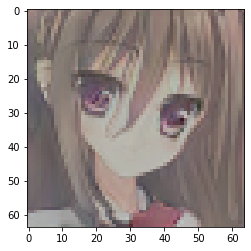

In [54]:
#!g1.1
G.eval()
z = (torch.rand(size=[batch_size, n_noise])*2-1).to(DEVICE)
Image = TensorToImage(G(z).detach().cpu()[0], 0.5, 0.225)
plt.imshow(Image)

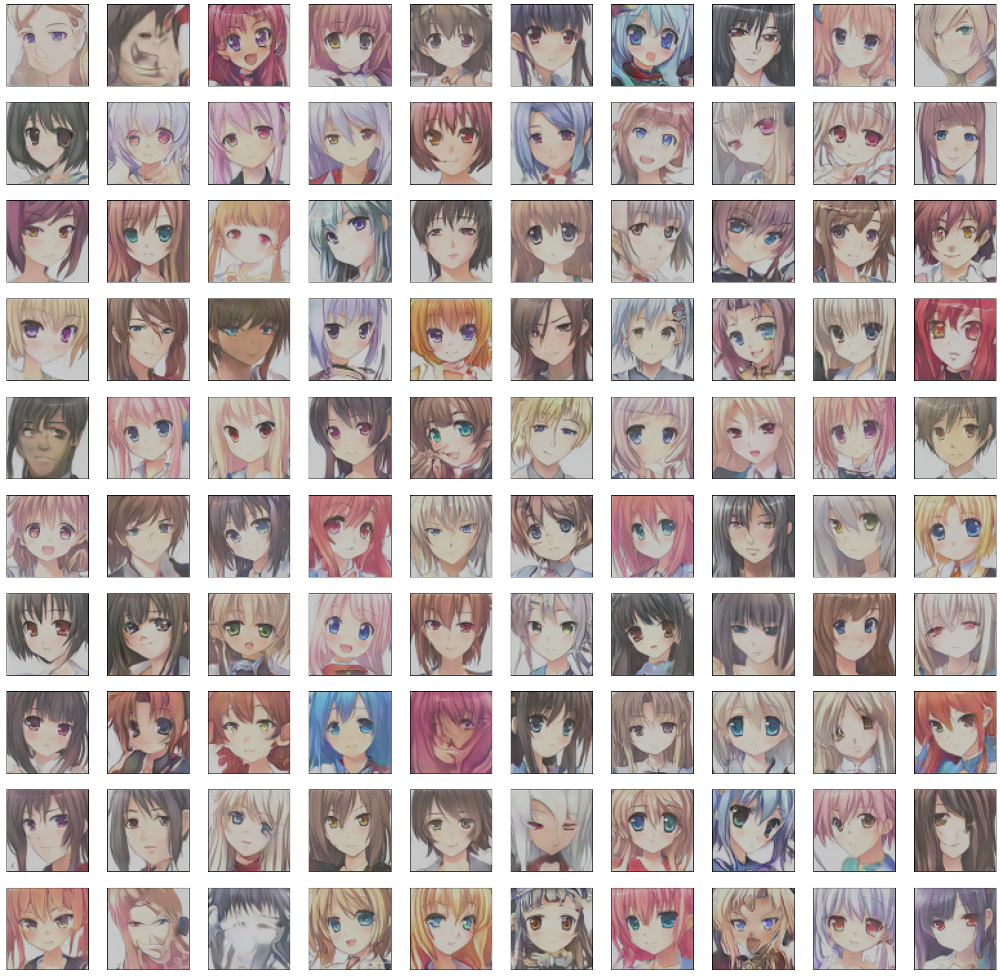

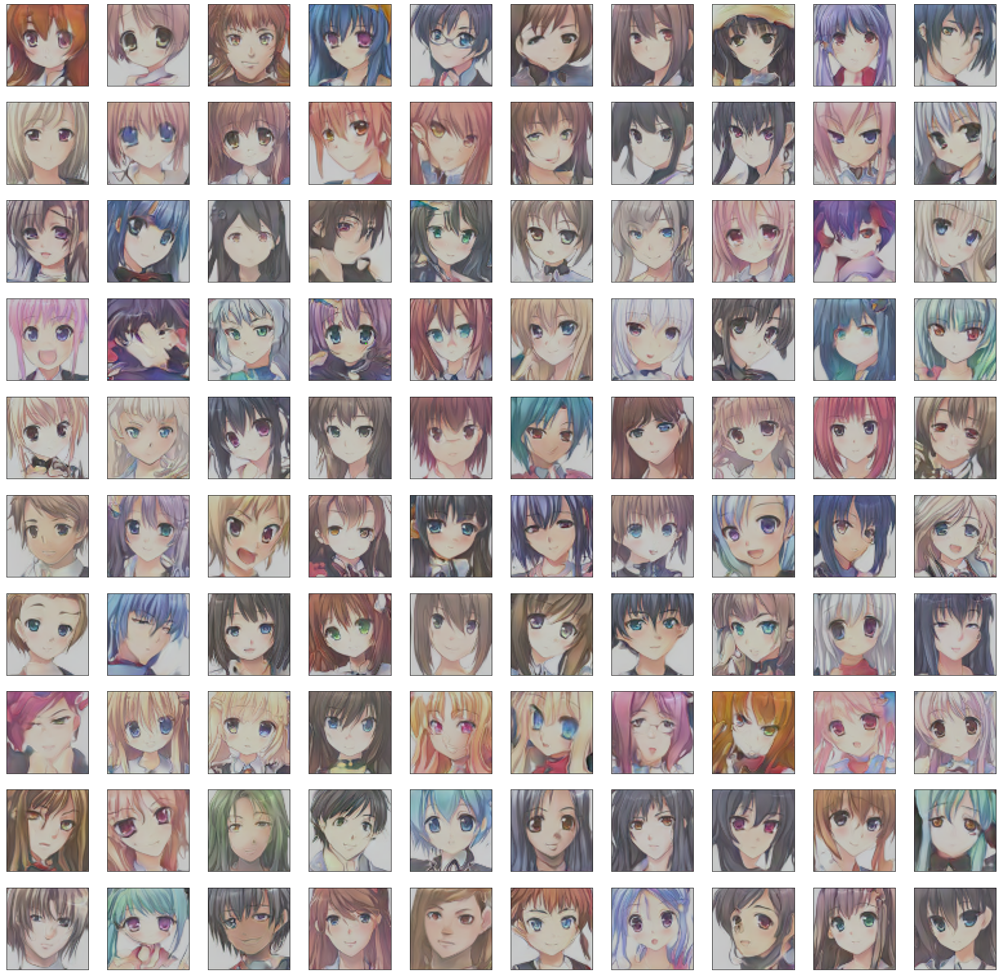

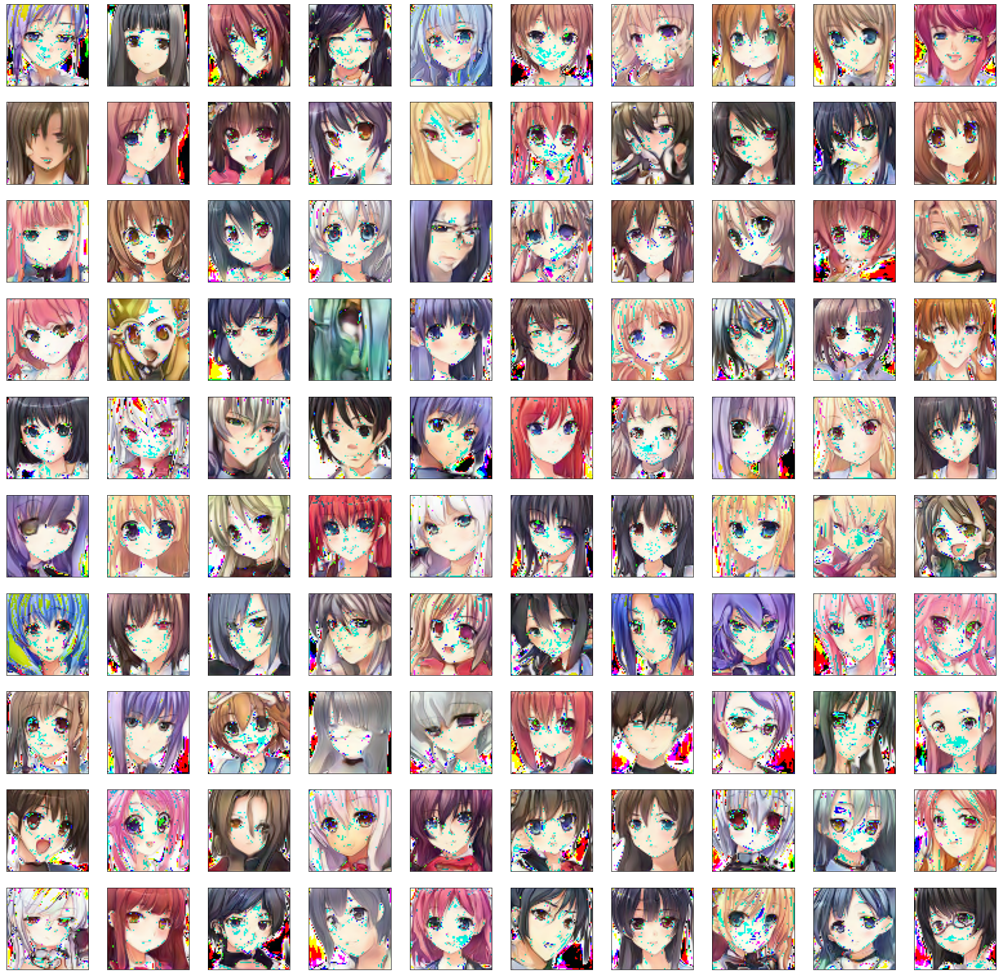

In [59]:
#!g1.1
# Plot generated image
random_img = lambda: int(np.random.rand(1)[0] * len(dataset))
plot_width, plot_height = 10, 10

fig = plt.figure(figsize=(3 * plot_width, 3 * plot_height))
for sample_n in range(1, plot_width * plot_height + 1):
    ax = fig.add_subplot(plot_height, plot_width, sample_n)
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)
    G.eval()
    z = (torch.rand(size=[1, n_noise])*2-1).to(DEVICE)
    Image = TensorToImage(G(z).detach().cpu()[0], 0.5, 0.5)
    plt.imshow(Image)
    # plt.imshow(TensorToImage(G(z).view(3, 64, 64).detach().cpu(), 0.5, 0.4))

In [ ]:
save_checkpoint({'global_step': step,
     'D':D.state_dict(),
     'G':G.state_dict(),
     'd_optim': D_opt.state_dict(),
     'g_optim' : G_opt.state_dict()},
    'ckpt/r1gan{:06d}.pth.tar'.format(step))

### Random Sample

In [ ]:
G_path = sorted(glob.glob(os.path.join('ckpt', '*.pth.tar')))[-1]
state = torch.load(G_path)
G.load_state_dict(state['G'])

In [ ]:
G.eval()
None

In [ ]:
img = get_sample_image(G, n_noise, n_samples=25)
imshow(img)

In [ ]:
# Fake Image
idx = [3, 1]
row, col = IMAGE_DIM[0]*idx[0], IMAGE_DIM[1]*idx[1]
imshow(img[row:row+IMAGE_DIM[0], col:col+IMAGE_DIM[1], :])

In [ ]:
# Real Image
i = 14
rimg = tensor2img(images[i])
imshow(rimg)

### Interpolation

In [ ]:
def sample_noise(size=None):
    z = np.random.random(size=size)*2-1
    return z

In [ ]:
z_a, z_b = sample_noise(n_noise), sample_noise(n_noise)
zs = torch.tensor([np.linspace(z_a[i], z_b[i], num=10) for i in range(n_noise)], dtype=torch.float32).to(DEVICE)
zs = torch.transpose(zs, 0, 1)
zs.shape

In [ ]:
imgs = G(zs).detach()
imgs = torch.cat([imgs[i] for i in range(10)], dim=-1)
imgs.shape

In [ ]:
fig = plt.figure(figsize=(20, 3))
imshow(tensor2img(imgs))

In [ ]:
#!c1.4
